In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns

In [2]:
data=pd.read_csv("diabetic_data.csv")

In [3]:
data

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [ ]:
data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [6]:
data.duplicated().value_counts()

False    101766
Name: count, dtype: int64

In [11]:
data.drop_duplicates()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [13]:
gender_count=data["gender"].value_counts()

In [15]:
gender_count

gender
Female             54708
Male               47055
Unknown/Invalid        3
Name: count, dtype: int64

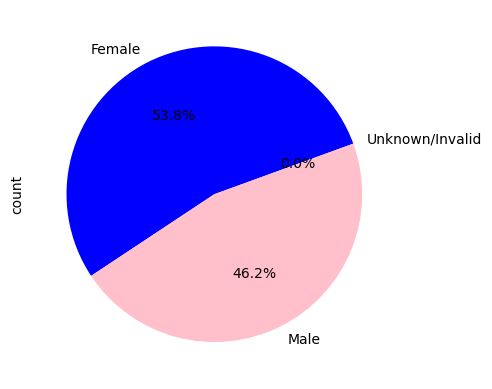

In [17]:
colors = ['blue', 'pink', 'lightgray']
gender_count.plot(kind="pie",labels=gender_count.index,autopct="%1.1f%%",colors=colors,startangle=20)
plt.show()

In [19]:
readmission=data["readmitted"].value_counts()

In [21]:
readmission

readmitted
NO     54864
>30    35545
<30    11357
Name: count, dtype: int64

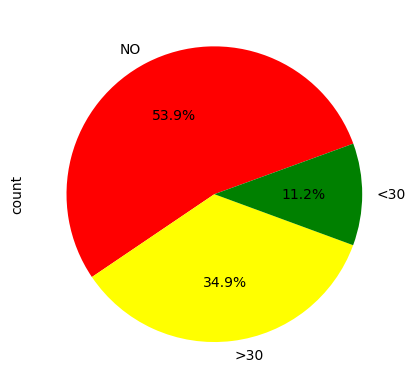

In [21]:
readmission.plot(kind="pie",labels=readmission.index,colors=("red","yellow","green"),autopct="%1.1f%%",startangle=20)
plt.show()

In [23]:
data["readmitted"].head(10)

0     NO
1    >30
2     NO
3     NO
4     NO
5    >30
6     NO
7    >30
8     NO
9     NO
Name: readmitted, dtype: object

In [25]:
gender_by_readmitted=pd.crosstab(data["gender"],data["readmitted"])
gender_by_readmitted

readmitted,<30,>30,NO
gender,,,
Female,6152,19518,29038
Male,5205,16027,25823
Unknown/Invalid,0,0,3


In [27]:
age_group=data["age"].value_counts()

In [29]:
age_group.sort_values(ascending=False)

age
[70-80)     26068
[60-70)     22483
[50-60)     17256
[80-90)     17197
[40-50)      9685
[30-40)      3775
[90-100)     2793
[20-30)      1657
[10-20)       691
[0-10)        161
Name: count, dtype: int64

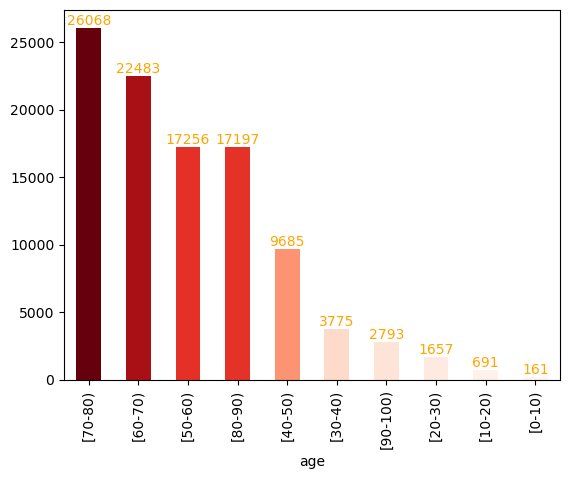

In [31]:
values=age_group.values
colors=cm.Reds(values/values.max())
ax=age_group.plot(kind="bar",color=colors)
for container in ax.containers:
    ax.bar_label(container,color="orange")
plt.show()

In [33]:
data["tolazamide"].value_counts()

tolazamide
No        101727
Steady        38
Up             1
Name: count, dtype: int64

In [35]:
gender_by_tolzamide=pd.crosstab(data["gender"],data["tolazamide"])
gender_by_tolzamide

tolazamide,No,Steady,Up
gender,,,
Female,54694,14,0
Male,47030,24,1
Unknown/Invalid,3,0,0


In [37]:
np.random.seed(42)
data_frame=pd.DataFrame({
    "patient_id":np.arange(1,101),
    "Age":np.random.randint(18,90,100),
    "Gender":np.random.choice(["male","female"],100),
    "Diagnosis":np.random.choice(["diabetics","hypertension","Heart disease"],100,p=[0.4,0.4,0.2]),
    "Total Bill":np.random.normal(70000,20000,100).round()
})
data_frame["Total Bill"]=data_frame["Total Bill"].clip(5000)

In [41]:
data_frame

,patient_id,Age,Gender,Diagnosis,Total Bill
0,1,69,female,hypertension,70840.0
1,2,32,female,diabetics,67255.0
2,3,89,male,Heart disease,67517.0
3,4,78,male,Heart disease,84807.0
4,5,38,male,diabetics,60951.0
...,...,...,...,...,...
95,96,65,male,hypertension,95611.0
96,97,40,female,hypertension,57697.0
97,98,79,female,diabetics,112226.0
98,99,54,female,hypertension,83737.0


In [43]:
data_frame["Diagnosis"].value_counts()

Diagnosis
diabetics        44
hypertension     39
Heart disease    17
Name: count, dtype: int64

In [45]:
p90=data_frame["Total Bill"].quantile(0.90)
p90

100895.7

In [146]:
data_frame["Total Bill"].quantile([0.25,0.5,0.75,0.90])

0.25     60450.50
0.50     71727.00
0.75     88125.25
0.90    100895.70
Name: Total Bill, dtype: float64

In [148]:
high_cost_rate=(data_frame["Total Bill"]>=50000).mean()*100

In [150]:
high_cost_rate

88.0

In [152]:
rate=(data_frame["Diagnosis"]=="hypertension").mean()*100

In [154]:
rate

39.0

In [156]:
top_10_patients=data_frame.sort_values(by="Total Bill",ascending=False).head(10)

In [158]:
top_10_patients

,patient_id,Age,Gender,Diagnosis,Total Bill
50,51,67,female,hypertension,117781.0
87,88,22,female,diabetics,116960.0
97,98,79,female,diabetics,112226.0
75,76,62,male,hypertension,107440.0
71,72,77,female,diabetics,106874.0
51,52,21,female,hypertension,106868.0
13,14,81,male,Heart disease,105259.0
61,62,79,female,Heart disease,103226.0
69,70,41,male,diabetics,103027.0
46,47,25,male,Heart disease,101208.0


In [160]:
threshold=data_frame["Total Bill"].quantile(0.90)
top_10_percent_patient=data_frame[data_frame["Total Bill"]>=threshold]

In [162]:
top_10_percent_patient

,patient_id,Age,Gender,Diagnosis,Total Bill
13,14,81,male,Heart disease,105259.0
46,47,25,male,Heart disease,101208.0
50,51,67,female,hypertension,117781.0
51,52,21,female,hypertension,106868.0
61,62,79,female,Heart disease,103226.0
69,70,41,male,diabetics,103027.0
71,72,77,female,diabetics,106874.0
75,76,62,male,hypertension,107440.0
87,88,22,female,diabetics,116960.0
97,98,79,female,diabetics,112226.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [11]:
data["change"].value_counts()

change
No    54755
Ch    47011
Name: count, dtype: int64

In [15]:
data["diabetesMed"].value_counts()

diabetesMed
Yes    78363
No     23403
Name: count, dtype: int64

In [35]:
diagnosis=data.groupby(["diag_1","diag_2","diag_3"])
for key, group in diagnosis:
    print("key:",key)
    print("diag_1:",key[0])
    print("diag_2:",key[1])
    print("diag_3:",key[2])
    print()

key: ('10', '585', '14')
diag_1: 10
diag_2: 585
diag_3: 14

key: ('11', '162', '427')
diag_1: 11
diag_2: 162
diag_3: 427

key: ('11', '250.01', '401')
diag_1: 11
diag_2: 250.01
diag_3: 401

key: ('11', '250.02', 'V15')
diag_1: 11
diag_2: 250.02
diag_3: V15

key: ('11', '401', '250')
diag_1: 11
diag_2: 401
diag_3: 250

key: ('11', '403', '585')
diag_1: 11
diag_2: 403
diag_3: 585

key: ('11', '428', '780')
diag_1: 11
diag_2: 428
diag_3: 780

key: ('11', '496', '250.02')
diag_1: 11
diag_2: 496
diag_3: 250.02

key: ('11', '496', '707')
diag_1: 11
diag_2: 496
diag_3: 707

key: ('11', '518', '348')
diag_1: 11
diag_2: 518
diag_3: 348

key: ('11', '714', '250')
diag_1: 11
diag_2: 714
diag_3: 250

key: ('110', '250.7', '785')
diag_1: 110
diag_2: 250.7
diag_3: 785

key: ('110', '332', '250.8')
diag_1: 110
diag_2: 332
diag_3: 250.8

key: ('112', '198', '198')
diag_1: 112
diag_2: 198
diag_3: 198

key: ('112', '198', '599')
diag_1: 112
diag_2: 198
diag_3: 599

key: ('112', '204', '284')
diag_1: 112

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



array(['?', '250.01', '250', ..., '590', '285', '530'], dtype=object)

In [45]:
!git --version

git version 2.53.0.windows.1


In [49]:
!git --version

git version 2.53.0.windows.1


In [51]:
!git init

Initialized empty Git repository in C:/Users/Pavan/Desktop/healthcare_project/data/raw/.git/


In [53]:
!git status

On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.ipynb_checkpoints/
	01_data_loading_and_cleaning.ipynb.ipynb
	BP dataset.csv
	Untitled.ipynb
	Untitled1.ipynb
	diabetic.ipynb
	diabetic_data.csv
	healthcare_raw1.csv
	heart_data_set.csv
	hospital (1).csv
	htn_data_set.ipynb
	stroke_data_set_raw.csv

nothing added to commit but untracked files present (use "git add" to track)


In [75]:
!git add .

In [73]:
!git config --global core.autocrlf true

In [77]:
!git commit -m "git complete"

[master 9bb952e] git complete
 1 file changed, 90 insertions(+), 1 deletion(-)


In [79]:
!git log

commit 9bb952eaa45dc1ac753547192097a97c9d336370
Author: pavankalyan180 <pavankalyan0180@gmail.com>
Date:   Mon Feb 16 13:31:17 2026 +0530

    git complete

commit d51e395ce58e7e87f5ceaf24ef25f82fddcd6e85
Author: pavankalyan180 <pavankalyan0180@gmail.com>
Date:   Mon Feb 16 13:27:59 2026 +0530

    git complete


In [81]:
! git show d51e395ce58e7e87f5ceaf24ef25f82fddcd6e85

commit d51e395ce58e7e87f5ceaf24ef25f82fddcd6e85
Author: pavankalyan180 <pavankalyan0180@gmail.com>
Date:   Mon Feb 16 13:27:59 2026 +0530

    git complete

diff --git a/.ipynb_checkpoints/01_data_loading_and_cleaning.ipynb-checkpoint.ipynb b/.ipynb_checkpoints/01_data_loading_and_cleaning.ipynb-checkpoint.ipynb
new file mode 100644
index 0000000..d9e6649
--- /dev/null
+++ b/.ipynb_checkpoints/01_data_loading_and_cleaning.ipynb-checkpoint.ipynb
@@ -0,0 +1,13352 @@
+{
+ "cells": [
+  {
+   "cell_type": "code",
+   "execution_count": 1,
+   "id": "809e689b-ef29-4ab0-b447-cb353942f21f",
+   "metadata": {},
+   "outputs": [],
+   "source": [
+    "import pandas as pd\n",
+    "import numpy as np\n",
+    "import matplotlib.pyplot as plt\n",
+    "import seaborn as sns\n",
+    "import os"
+   ]
+  },
+  {
+   "cell_type": "code",
+   "execution_count": 2,
+   "id": "586d4ef1-486c-4802-a188-2c2d62c7477c",
+   "metadata": {},
+   "outputs": [],
+   "source": [
+    "data=pd.read_csv(r\"C:\\U

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



+       "      <td>Urban</td>\n",
+       "      <td>171.23</td>\n",
+       "      <td>34.40</td>\n",
+       "      <td>3</td>\n",
+       "      <td>1</td>\n",
+       "      <td>2</td>\n",
+       "      <td>45_60</td>\n",
+       "      <td>obese</td>\n",
+       "      <td>0</td>\n",
+       "      <td>3</td>\n",
+       "      <td>high_risk</td>\n",
+       "    </tr>\n",
+       "    <tr>\n",
+       "      <th>4</th>\n",
+       "      <td>1665</td>\n",
+       "      <td>0</td>\n",
+       "      <td>79</td>\n",
+       "      <td>1</td>\n",
+       "      <td>0</td>\n",
+       "      <td>Yes</td>\n",
+       "      <td>Self-employed</td>\n",
+       "      <td>Rural</td>\n",
+       "      <td>174.12</td>\n",
+       "      <td>24.00</td>\n",
+       "      <td>0</td>\n",
+       "      <td>1</td>\n",
+       "      <td>2</td>\n",
+       "      <td>60+</td>\n",
+       "      <td>Normal</td>\n",
+       "      <td>1</td>\n",
+       "      <td>3</td>\n",
+       "      <td

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



+       "      <td>2</td>\n",
+       "      <td>32</td>\n",
+       "      <td>female</td>\n",
+       "      <td>diabetics</td>\n",
+       "      <td>67255.0</td>\n",
+       "    </tr>\n",
+       "    <tr>\n",
+       "      <th>2</th>\n",
+       "      <td>3</td>\n",
+       "      <td>89</td>\n",
+       "      <td>male</td>\n",
+       "      <td>Heart disease</td>\n",
+       "      <td>67517.0</td>\n",
+       "    </tr>\n",
+       "    <tr>\n",
+       "      <th>3</th>\n",
+       "      <td>4</td>\n",
+       "      <td>78</td>\n",
+       "      <td>male</td>\n",
+       "      <td>Heart disease</td>\n",
+       "      <td>84807.0</td>\n",
+       "    </tr>\n",
+       "    <tr>\n",
+       "      <th>4</th>\n",
+       "      <td>5</td>\n",
+       "      <td>38</td>\n",
+       "      <td>male</td>\n",
+       "      <td>diabetics</td>\n",
+       "      <td>60951.0</td>\n",
+       "    </tr>\n",
+       "    <tr>\n",
+       "      <th>...</th>\n",
+       "      <

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [83]:
! git diff

diff --git a/diabetic.ipynb b/diabetic.ipynb
index 8ef8d90..90e7a4f 100644
--- a/diabetic.ipynb
+++ b/diabetic.ipynb
@@ -202937,100 +202937,80 @@
   },
   {
    "cell_type": "code",
-   "execution_count": 55,
+   "execution_count": 75,
    "id": "ae708175-a745-4100-8df7-969c91b121e5",
    "metadata": {},
-   "outputs": [
-    {
-     "name": "stderr",
-     "output_type": "stream",
-     "text": [
-      "warning: in the working copy of '.ipynb_checkpoints/01_data_loading_and_cleaning.ipynb-checkpoint.ipynb', LF will be replaced by CRLF the next time Git touches it\n",
-      "warning: in the working copy of '.ipynb_checkpoints/BP dataset-checkpoint.csv', LF will be replaced by CRLF the next time Git touches it\n",
-      "warning: in the working copy of '.ipynb_checkpoints/Untitled-checkpoint.ipynb', LF will be replaced by CRLF the next time Git touches it\n",
-      "warning: in the working copy of '.ipynb_checkpoints/Untitled1-checkpoint.ipynb', LF will be replaced by CRLF the next 

In [85]:
! git branch

* master


In [87]:
! git branch -M powerstar

In [89]:
! git branch 

* powerstar


In [91]:
! git remote -v

In [93]:
! git log --graph

* commit 9bb952eaa45dc1ac753547192097a97c9d336370
| Author: pavankalyan180 <pavankalyan0180@gmail.com>
| Date:   Mon Feb 16 13:31:17 2026 +0530
| 
|     git complete
| 
* commit d51e395ce58e7e87f5ceaf24ef25f82fddcd6e85
  Author: pavankalyan180 <pavankalyan0180@gmail.com>
  Date:   Mon Feb 16 13:27:59 2026 +0530
  
      git complete


In [95]:
! git tag

In [99]:
! git blame C:/Users/Pavan/Desktop/healthcare_project/data/raw/

fatal: no such path '' in HEAD


In [101]:
! git log --list

fatal: unrecognized argument: --list
